<a href="https://colab.research.google.com/github/sayannath/Blood-Cell-Detection-TFOD-2.0/blob/master/Blood_Cell_Detection_Scaled_YOLOv4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Blood Cell Detection using Scaled-YOLOv4

## Intial-Setup

### Clone `Scaled-YOLOV4` Repository

In [ ]:
!git clone https://github.com/roboflow-ai/ScaledYOLOv4.git
%cd /content/ScaledYOLOv4/

Cloning into 'ScaledYOLOv4'...
remote: Enumerating objects: 128, done.
remote: Total 128 (delta 0), reused 0 (delta 0), pack-reused 128
Receiving objects: 100% (128/128), 389.37 KiB | 1.31 MiB/s, done.
Resolving deltas: 100% (39/39), done.
/content/ScaledYOLOv4


In [ ]:
!git checkout yolov4-large #Using yolov4-large
%cd /content/

Branch 'yolov4-large' set up to track remote branch 'yolov4-large' from 'origin'.
Switched to a new branch 'yolov4-large'
/content


### Imports

In [ ]:
import torch
print('Torch Version %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Torch Version 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


### Install Mish-Cuda

In [ ]:
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda

Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 1.13 MiB/s, done.
Resolving deltas: 100% (56/56), done.
/content/mish-cuda


In [ ]:
!python setup.py build install

/usr/lib/python3.7/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/mish_cuda.egg-info/SOURCES.txt'
/usr/local/lib/python3.7/dist-packages/torch/utils/cpp_extension.py:370: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
adding license file 'LICENSE'
writing manifest file 'src/mish

### Install 

In [ ]:
!pip install -q -U PyYAML

In [ ]:
%cd /content/ScaledYOLOv4/

/content/ScaledYOLOv4


In [ ]:
%cd /content

/content


## Data Gathering

In [ ]:
!curl -L "https://app.roboflow.com/ds/ANwD30uLgw?key=z4XrO4x5xX" > roboflow.zip; unzip -q roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   895  100   895    0     0    856      0  0:00:01  0:00:01 --:--:--   856
100 12.7M  100 12.7M    0     0  9010k      0  0:00:01  0:00:01 --:--:-- 9010k


In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['Platelets', 'RBC', 'WBC']

## Model Architecture

In [ ]:
%cat /content/ScaledYOLOv4/models/yolov4-csp.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [12,16, 19,36, 40,28]  # P3/8
  - [36,75, 76,55, 72,146]  # P4/16
  - [142,110, 192,243, 459,401]  # P5/32

# yolov4-csp backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [32, 3, 1]],  # 0
   [-1, 1, Conv, [64, 3, 2]],  # 1-P1/2
   [-1, 1, Bottleneck, [64]],
   [-1, 1, Conv, [128, 3, 2]],  # 3-P2/4
   [-1, 2, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 5-P3/8
   [-1, 8, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 7-P4/16
   [-1, 8, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]], # 9-P5/32
   [-1, 4, BottleneckCSP, [1024]],  # 10
  ]

# yolov4-csp head
# na = len(anchors[0])
head:
  [[-1, 1, SPPCSP, [512]], # 11
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [8, 1, Conv, [256, 1, 1]], # route backbone P4
   [[-1, -2], 1, Concat, [1]],
   [-1, 2, Bott

## Train the Detector

**Description**
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
%cd /content/ScaledYOLOv4/

/content/ScaledYOLOv4


In [ ]:
%%time
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/yolov4-csp.yaml --weights '' --name yolov4-csp-results  --cache

Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov4-csp.yaml', data='../data.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', img_size=[416, 416], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov4-csp-results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='', world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.5, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'mixup': 0.0}
Overriding ./models/yo

### Load the Tensorboard 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### View Results

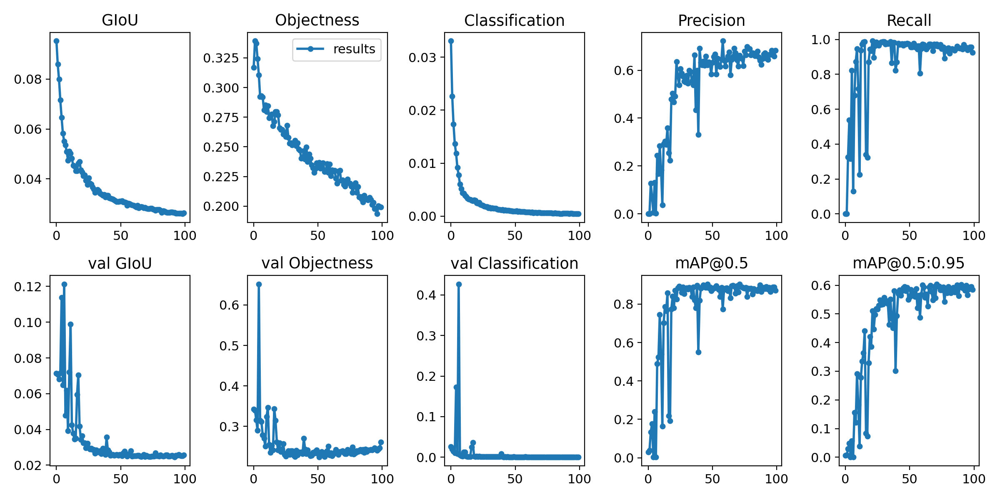

In [ ]:
from IPython.display import Image, display
display(Image('/content/ScaledYOLOv4/runs/exp0_yolov4-csp-results/results.png')) 

## Inference with Trained Weights

In [17]:
%ls runs/

exp0_yolov4-csp-results/


In [18]:
%ls ./runs/exp0_yolov4-csp-results/weights

best_yolov4-csp-results.pt        last_080.pt  last_092.pt
best_yolov4-csp-results_strip.pt  last_081.pt  last_093.pt
last_070.pt                       last_082.pt  last_094.pt
last_071.pt                       last_083.pt  last_095.pt
last_072.pt                       last_084.pt  last_096.pt
last_073.pt                       last_085.pt  last_097.pt
last_074.pt                       last_086.pt  last_098.pt
last_075.pt                       last_087.pt  last_099.pt
last_076.pt                       last_088.pt  last_yolov4-csp-results.pt
last_077.pt                       last_089.pt  last_yolov4-csp-results_strip.pt
last_078.pt                       last_090.pt
last_079.pt                       last_091.pt


In [20]:
%cd /content/ScaledYOLOv4/
!python detect.py --weights ./runs/exp0_yolov4-csp-results/weights/best_yolov4-csp-results.pt --img 416 --conf 0.4 --source ../test/images

/content/ScaledYOLOv4
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights=['./runs/exp0_yolov4-csp-results/weights/best_yolov4-csp-results.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Fusing layers... Model Summary: 235 layers, 5.24813e+07 parameters, 5.04494e+07 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image 1/36 /content/test/images/BloodImage_00038_jpg.rf.ad5f63b17cf044759666277323ad3755.jpg: 416x416 1 Platele

Note: 0.02 secs per image

## Visualise all the Test Images

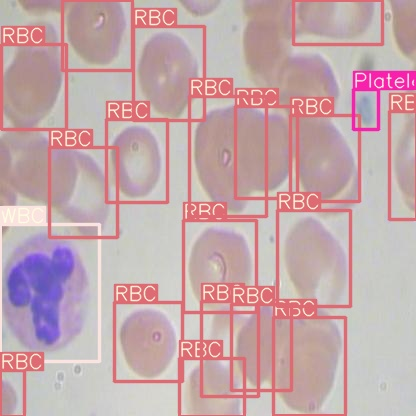

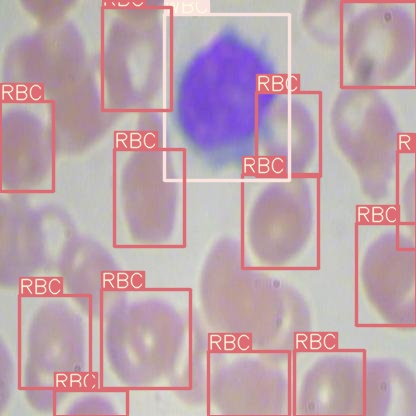

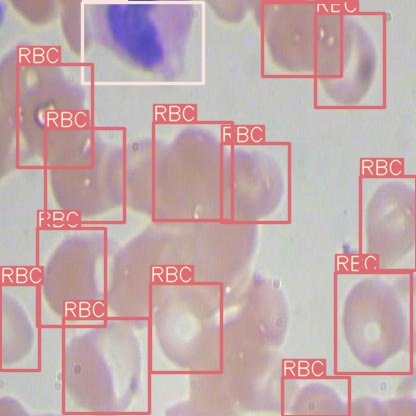

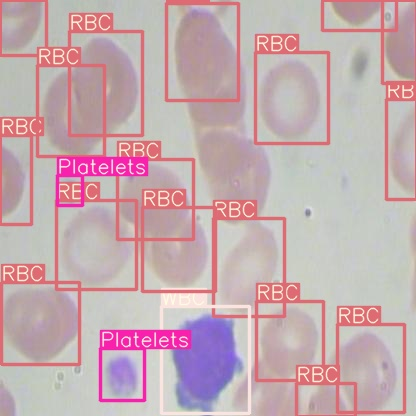

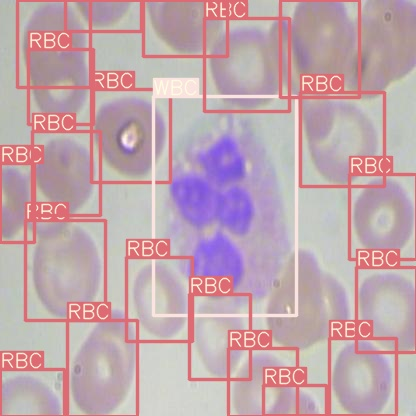

...

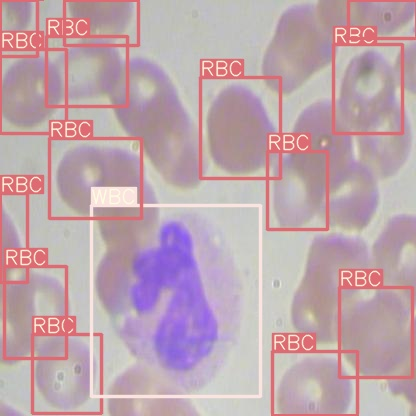

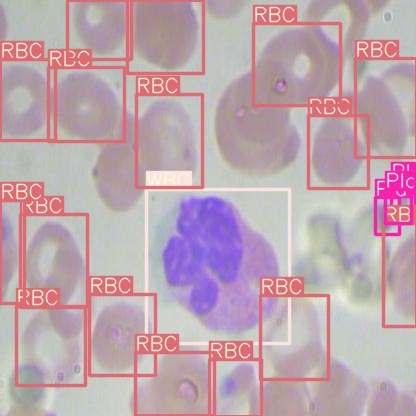

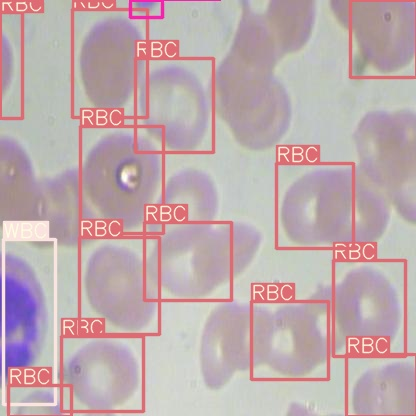

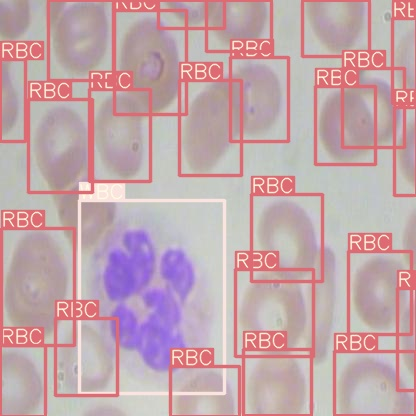

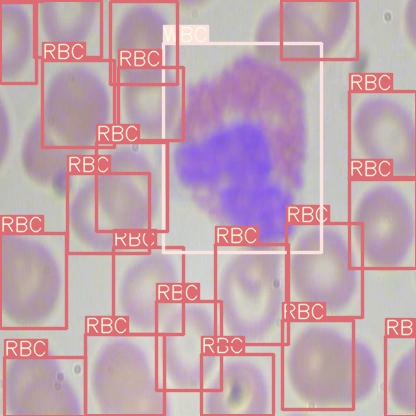

In [21]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('./inference/output/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

### Save the Weights and Output Images

In [22]:
!cp -r '/content/ScaledYOLOv4/runs/' '/content/drive/MyDrive/Blood-Cell-TFOD-Saved-Model/Scaled-YoloV4/'

In [25]:
!cp -r '/content/ScaledYOLOv4/inference/' '/content/drive/MyDrive/Blood-Cell-TFOD-Saved-Model/Scaled-YoloV4/'

In [24]:
!cp -r '/content/data.yaml' '/content/drive/MyDrive/Blood-Cell-TFOD-Saved-Model/Scaled-YoloV4/'